In [1]:
import os

import rasterio
from rasterio.plot import show

import matplotlib.pyplot as plt
from PIL import Image

import geopandas as gpd

## Prep

Since the satellite image is heavy, please download it from [here](https://drive.google.com/drive/folders/1FSVK94mnjWzLqLBnB2Dr9wzwkvio3ROk) (download "33cae6.tif" and store it in "../data").

## Process satellite images with rasterio

In [2]:
# Import and see the class of raster data
path = "../data/33cae6.tif"

data = rasterio.open(path)
type(data)

rasterio.io.DatasetReader

In [3]:
# Get the general info of raster data
data.profile

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 37113, 'height': 34306, 'count': 4, 'crs': CRS.from_epsg(32737), 'transform': Affine(0.0774800032377243, 0.0, 531847.0,
       0.0, -0.0774800032377243, 9367848.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'jpeg', 'interleave': 'pixel'}

In [4]:
# Get the boundry of raster data
data.bounds

BoundingBox(left=531847.0, bottom=9365189.971008927, right=534722.5153601617, top=9367848.0)

In [5]:
# Get the longitude and latitude of centroid
data.lnglat()

(39.30061294996244, -5.731031019254337)

In [6]:
# Get the resolution at vertical and horizontal level in terms of pixel/meter
data.res

(0.0774800032377243, 0.0774800032377243)

In [7]:
# Reduce the resolution
dst_res = 0.1
dst_path = "../data/random2.tif"

command = "gdalwarp "+ \
"-co COMPRESS=JPEG " + \
"-co TILED=YES "+ \
"-co NUM_THREADS=ALL_CPUS "+ \
"-r bilinear -tr {} -{} {} {}".format(dst_res, dst_res, path, dst_path)

os.system(command)

Using band 4 of source image as alpha.
Creating output file that is 28755P x 26580L.
Processing ../data/33cae6.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.


0

In [8]:
# Import the low-resolution version of satellite image
img = rasterio.open(dst_path)
img.profile

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 28755, 'height': 26580, 'count': 4, 'crs': CRS.from_epsg(32737), 'transform': Affine(0.1, 0.0, 531847.0,
       0.0, -0.1, 9367848.0), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'jpeg', 'interleave': 'pixel'}

In [9]:
# check the resolution
img.res

(0.1, 0.1)

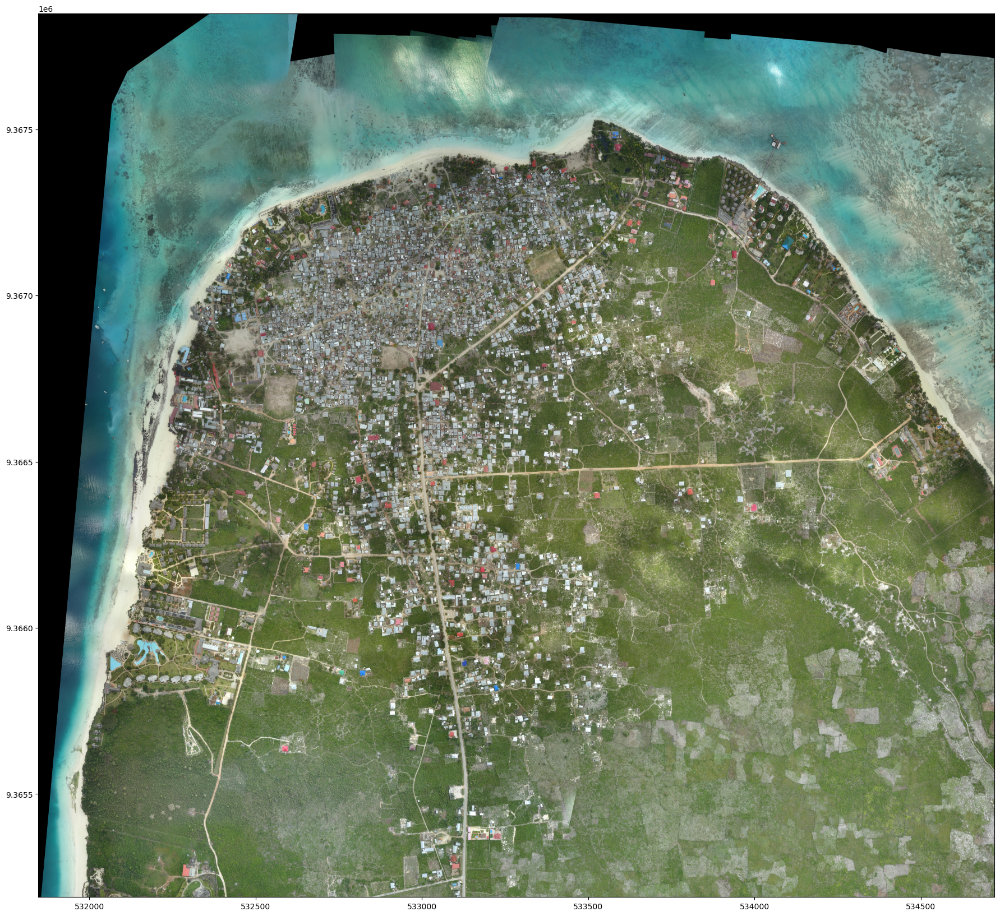

<AxesSubplot:>

In [10]:
# Plot the satellite image by rasterio.plot.show
plt.figure(figsize=(22,22))
show(img)

## Process GeoJSON with geopandas

GeoJSON is a tyoe of format for vector data (ex. point, line, multiline, and polygon).
In order to deal with vector data, we will use geopandas.

In [11]:
# Import the GeoJSON
geojson_dir = "../data/33cae6_reprojected.geojson"
gdf = gpd.read_file(geojson_dir)

In [12]:
# check the contents
gdf

,pk_0,pk,pkuid,building,unfinished,problemati,changeset,area,condition,geometry
0,1,None,None,yes,None,None,None,None,Complete,"POLYGON ((533700.105 9367442.728, 533702.294 9..."
1,2,None,None,yes,None,None,None,None,Complete,"POLYGON ((532578.944 9367199.777, 532584.104 9..."
2,3,None,None,yes,None,None,None,None,Complete,"POLYGON ((532569.882 9367194.419, 532578.746 9..."
3,4,None,None,yes,None,None,None,None,Complete,"POLYGON ((532558.704 9367192.699, 532568.229 9..."
4,5,None,None,yes,None,None,None,None,Complete,"POLYGON ((532549.179 9367197.594, 532558.241 9..."
...,...,...,...,...,...,...,...,...,...,...
4434,4463,None,None,yes,None,None,None,None,Foundation,"POLYGON ((532840.841 9366923.949, 532842.627 9..."
4435,4464,None,None,yes,None,None,None,None,Complete,"POLYGON ((533375.757 9365762.996, 533388.259 9..."
4436,4465,None,None,yes,None,None,None,None,Foundation,"POLYGON ((533295.919 9365888.342, 533306.172 9..."
4437,4466,None,None,yes,None,None,None,None,Foundation,"POLYGON ((532854.691 9366432.318, 532858.216 9..."


<AxesSubplot:>

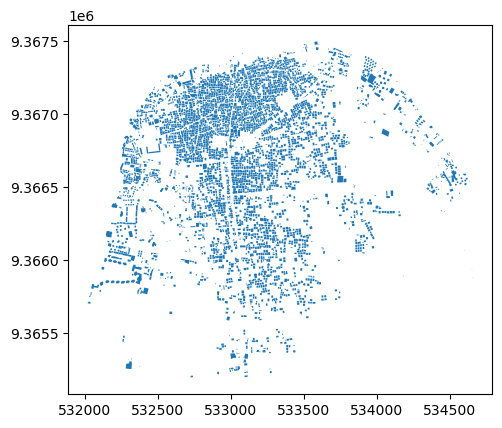

In [13]:
# briefly plot the vector data
gdf.plot()

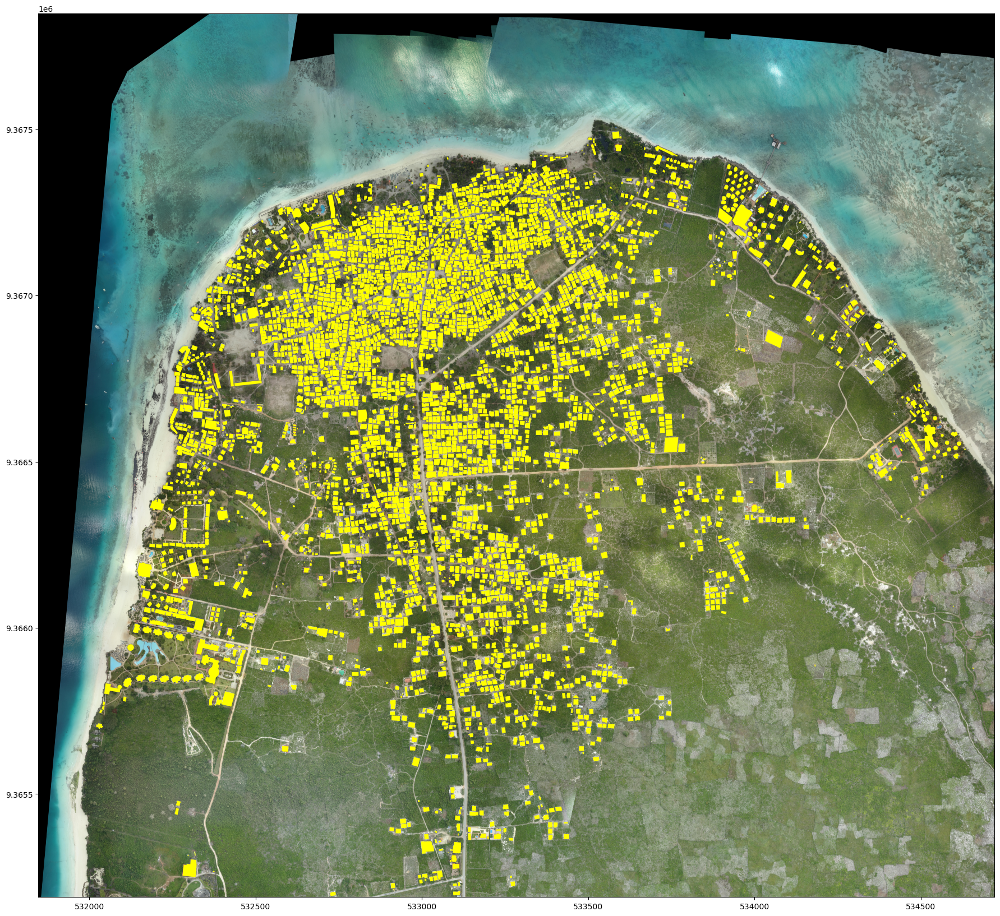

In [14]:
# mask the vector data on the satellite image
fig, ax = plt.subplots(figsize=(22,22))
show(img, ax=ax)
gdf.plot(ax=ax, color='yellow')
plt.show()